# 🐱🐶 CNN Image Classification — Cats vs. Dogs
### Transfer Learning with MobileNetV2 | Data Augmentation | Full ML Pipeline
---
**Dataset**: Asirra Cats vs. Dogs  
**Framework**: TensorFlow 2.x / Keras  
**Techniques**: Custom CNN, Transfer Learning (MobileNetV2), Fine-Tuning, Data Augmentation  

In [2]:
import os
import glob
import random
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, roc_curve
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, callbacks
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.preprocessing.image import ImageDataGenerator

warnings.filterwarnings('ignore')
tf.random.set_seed(42)
np.random.seed(42)
random.seed(42)

plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['axes.facecolor'] = '#F8F9FA'
plt.rcParams['axes.grid'] = True
plt.rcParams['grid.alpha'] = 0.3

print(f'TensorFlow version : {tf.__version__}')
print(f'Keras version      : {keras.__version__}')
print(f'NumPy version      : {np.__version__}')
print(f'GPU Available      : {tf.config.list_physical_devices("GPU")}')

TensorFlow version : 2.21.0
Keras version      : 3.12.3
NumPy version      : 1.26.4
GPU Available      : []


In [3]:
PROBLEM_STATEMENT = {
    'Problem Type'    : 'Binary Image Classification (Supervised Learning)',
    'Input'           : 'RGB JPEG image (any resolution)',
    'Output'          : 'Class label — Cat (0) or Dog (1)',
    'Classes'         : {0: 'Cat', 1: 'Dog'},
    'Primary Metric'  : 'Test Accuracy',
    'Other Metrics'   : ['AUC-ROC', 'F1-Score', 'Precision', 'Recall', 'Confusion Matrix'],
    'Dataset'         : 'Asirra Cats vs. Dogs (Microsoft Research)',
    'Models'          : ['Custom CNN (from scratch)', 'MobileNetV2 Transfer Learning'],
    'Success Criteria': {'Custom CNN': '>= 75%', 'Transfer Learning': '>= 88%'}
}

print('='*65)
print('        CNN IMAGE CLASSIFICATION — PROBLEM STATEMENT')
print('='*65)
for key, value in PROBLEM_STATEMENT.items():
    print(f'  {key:<20} : {value}')
print('='*65)

        CNN IMAGE CLASSIFICATION — PROBLEM STATEMENT
  Problem Type         : Binary Image Classification (Supervised Learning)
  Input                : RGB JPEG image (any resolution)
  Output               : Class label — Cat (0) or Dog (1)
  Classes              : {0: 'Cat', 1: 'Dog'}
  Primary Metric       : Test Accuracy
  Other Metrics        : ['AUC-ROC', 'F1-Score', 'Precision', 'Recall', 'Confusion Matrix']
  Dataset              : Asirra Cats vs. Dogs (Microsoft Research)
  Models               : ['Custom CNN (from scratch)', 'MobileNetV2 Transfer Learning']
  Success Criteria     : {'Custom CNN': '>= 75%', 'Transfer Learning': '>= 88%'}


##  Data Collection & Preparation
Load image file paths, validate images, filter corrupt files, sample 500 per class, and build a structured DataFrame.

In [4]:
DATA_DIR             = os.path.join('E:\cloud credits\Image Classification\Asirra_ cat vs dogs')
IMG_SIZE             = (224, 224)
NUM_SAMPLES_PER_CLASS = 500
BATCH_SIZE           = 32
RANDOM_STATE         = 42
CLASS_NAMES          = ['Cat', 'Dog']

cat_files = sorted(glob.glob(os.path.join(DATA_DIR, 'cat.*.jpg')))
dog_files = sorted(glob.glob(os.path.join(DATA_DIR, 'dog.*.jpg')))

print(f'Dataset directory  : {os.path.abspath(DATA_DIR)}')
print(f'Total cat files    : {len(cat_files)}')
print(f'Total dog files    : {len(dog_files)}')
print(f'Total files found  : {len(cat_files) + len(dog_files)}')


import os
import pandas as pd

dataset_path = r"E:\cloud credits\Image Classification\Asirra_ cat vs dogs"

data = []

for file in os.listdir(dataset_path):
    if file.lower().endswith((".jpg", ".jpeg", ".png")):

        label = 0 if file.startswith("cat") else 1
        class_name = "Cat" if label == 0 else "Dog"

        filepath = os.path.join(dataset_path, file)

        data.append({
            "filepath": filepath,
            "label": label,
            "class_name": class_name,
            "file_size_kb": os.path.getsize(filepath)/1024
        })

df = pd.DataFrame(data)

print(df.shape)
print(df.head())

Dataset directory  : E:\cloud credits\Image Classification\Asirra_ cat vs dogs
Total cat files    : 550
Total dog files    : 550
Total files found  : 1100
(1100, 4)
                                            filepath  label class_name  \
0  E:\cloud credits\Image Classification\Asirra_ ...      0        Cat   
1  E:\cloud credits\Image Classification\Asirra_ ...      0        Cat   
2  E:\cloud credits\Image Classification\Asirra_ ...      0        Cat   
3  E:\cloud credits\Image Classification\Asirra_ ...      0        Cat   
4  E:\cloud credits\Image Classification\Asirra_ ...      0        Cat   

   file_size_kb  
0     12.123047  
1     16.484375  
2     33.510742  
3     21.772461  
4     11.825195  


In [5]:
def is_valid_image(filepath):
    try:
        with Image.open(filepath) as img:
            img.verify()
        with Image.open(filepath) as img:
            img.convert('RGB')
        return True
    except Exception:
        return False

print('Validating cat images...')
valid_cats = [f for f in cat_files if is_valid_image(f)]
print('Validating dog images...')
valid_dogs = [f for f in dog_files if is_valid_image(f)]

print(f'\nValid cat images   : {len(valid_cats)} / {len(cat_files)}')
print(f'Valid dog images   : {len(valid_dogs)} / {len(dog_files)}')
print(f'Corrupt / removed  : {(len(cat_files)-len(valid_cats)) + (len(dog_files)-len(valid_dogs))}')

Validating cat images...
Validating dog images...

Valid cat images   : 550 / 550
Valid dog images   : 550 / 550
Corrupt / removed  : 0


In [6]:
random.seed(RANDOM_STATE)
selected_cats = random.sample(valid_cats, min(NUM_SAMPLES_PER_CLASS, len(valid_cats)))
selected_dogs = random.sample(valid_dogs, min(NUM_SAMPLES_PER_CLASS, len(valid_dogs)))

all_files  = selected_cats + selected_dogs
all_labels = [0] * len(selected_cats) + [1] * len(selected_dogs)

df = pd.DataFrame({
    'filepath'    : all_files,
    'label'       : all_labels,
    'class_name'  : ['Cat' if l == 0 else 'Dog' for l in all_labels],
    'file_size_kb': [round(os.path.getsize(f) / 1024, 2) for f in all_files]
})

df = df.sample(frac=1, random_state=RANDOM_STATE).reset_index(drop=True)

print(f'Dataset shape      : {df.shape}')
print(f'\nClass Distribution:')
print(df['class_name'].value_counts().to_string())
print(f'\nDataset Statistics:')
print(df[['label', 'file_size_kb']].describe().round(2).to_string())
print(f'\nFirst 5 rows:')
display(df.head())

Dataset shape      : (1000, 4)

Class Distribution:
class_name
Dog    500
Cat    500

Dataset Statistics:
        label  file_size_kb
count  1000.0       1000.00
mean      0.5         22.25
std       0.5         10.65
min       0.0          1.82
25%       0.0         14.90
50%       0.5         21.45
75%       1.0         28.54
max       1.0         70.83

First 5 rows:


,filepath,label,class_name,file_size_kb
0,E:\cloud credits\Image Classification\Asirra_ ...,1,Dog,27.03
1,E:\cloud credits\Image Classification\Asirra_ ...,1,Dog,20.31
2,E:\cloud credits\Image Classification\Asirra_ ...,1,Dog,41.62
3,E:\cloud credits\Image Classification\Asirra_ ...,1,Dog,18.25
4,E:\cloud credits\Image Classification\Asirra_ ...,0,Cat,30.13


---
##  Exploratory Data Analysis (EDA)
Visualise class balance, file size distributions, sample images, spatial dimensions, pixel intensity, and RGB channel statistics.

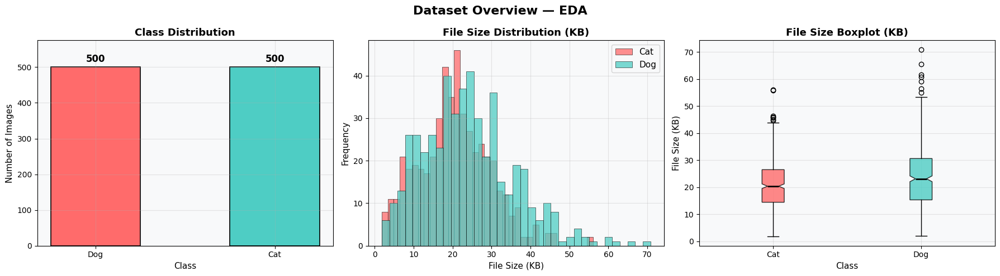

Mean file size — Cat: 20.52 KB | Dog: 23.98 KB


In [7]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Dataset Overview — EDA', fontsize=16, fontweight='bold')

class_counts = df['class_name'].value_counts()
bars = axes[0].bar(class_counts.index, class_counts.values,
                   color=['#FF6B6B', '#4ECDC4'], edgecolor='black', linewidth=1.2, width=0.5)
axes[0].set_title('Class Distribution', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Class', fontsize=11)
axes[0].set_ylabel('Number of Images', fontsize=11)
axes[0].set_ylim(0, max(class_counts.values) * 1.15)
for bar, count in zip(bars, class_counts.values):
    axes[0].text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 8,
                 str(count), ha='center', va='bottom', fontweight='bold', fontsize=12)

for cls, color in zip(['Cat', 'Dog'], ['#FF6B6B', '#4ECDC4']):
    data = df[df['class_name'] == cls]['file_size_kb']
    axes[1].hist(data, bins=35, alpha=0.75, color=color, label=cls, edgecolor='black', linewidth=0.5)
axes[1].set_title('File Size Distribution (KB)', fontsize=13, fontweight='bold')
axes[1].set_xlabel('File Size (KB)', fontsize=11)
axes[1].set_ylabel('Frequency', fontsize=11)
axes[1].legend(fontsize=11)

df_box = [df[df['class_name'] == 'Cat']['file_size_kb'].values,
          df[df['class_name'] == 'Dog']['file_size_kb'].values]
bp = axes[2].boxplot(df_box, labels=['Cat', 'Dog'], patch_artist=True, notch=True,
                     medianprops={'color': 'black', 'linewidth': 2})
bp['boxes'][0].set_facecolor('#FF6B6B')
bp['boxes'][1].set_facecolor('#4ECDC4')
for patch in bp['boxes']:
    patch.set_alpha(0.8)
axes[2].set_title('File Size Boxplot (KB)', fontsize=13, fontweight='bold')
axes[2].set_xlabel('Class', fontsize=11)
axes[2].set_ylabel('File Size (KB)', fontsize=11)

plt.tight_layout()
plt.savefig('eda_overview.png', dpi=150, bbox_inches='tight')
plt.show()
print(f"Mean file size — Cat: {df[df['class_name']=='Cat']['file_size_kb'].mean():.2f} KB | "
      f"Dog: {df[df['class_name']=='Dog']['file_size_kb'].mean():.2f} KB")

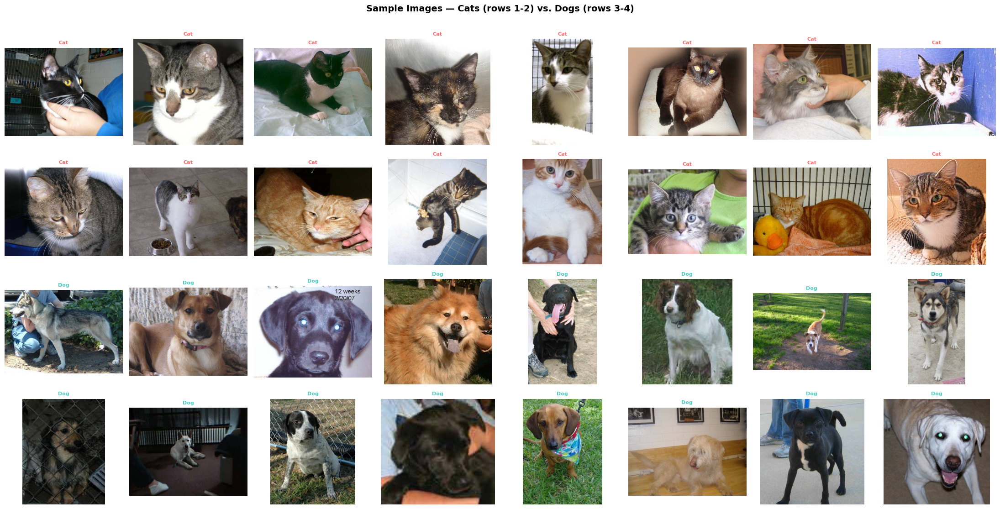

In [8]:
fig, axes = plt.subplots(4, 8, figsize=(22, 11))
fig.suptitle('Sample Images — Cats (rows 1-2) vs. Dogs (rows 3-4)', fontsize=14, fontweight='bold', y=1.01)

cat_samples = df[df['class_name'] == 'Cat'].sample(16, random_state=42)
dog_samples = df[df['class_name'] == 'Dog'].sample(16, random_state=42)

for idx, (_, row) in enumerate(cat_samples.iterrows()):
    ax = axes[idx // 8][idx % 8]
    img = Image.open(row['filepath']).convert('RGB')
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(f'Cat', fontsize=8, color='#FF6B6B', fontweight='bold')
    for spine in ax.spines.values():
        spine.set_edgecolor('#FF6B6B')
        spine.set_linewidth(2)

for idx, (_, row) in enumerate(dog_samples.iterrows()):
    ax = axes[2 + idx // 8][idx % 8]
    img = Image.open(row['filepath']).convert('RGB')
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(f'Dog', fontsize=8, color='#4ECDC4', fontweight='bold')
    for spine in ax.spines.values():
        spine.set_edgecolor('#4ECDC4')
        spine.set_linewidth(2)

plt.tight_layout()
plt.savefig('sample_images.png', dpi=150, bbox_inches='tight')
plt.show()

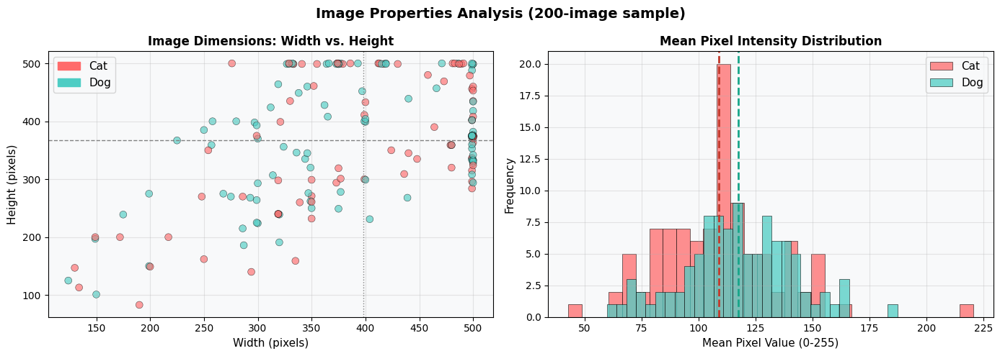

Average Width  : 398.4 px  |  Average Height : 366.7 px
Cat mean pixel : 109.09    |  Dog mean pixel : 117.40
Min dimension  : 83 px  |  Max dimension  : 500 px


In [9]:
widths, heights, mean_pixels, labels_scatter = [], [], [], []

sample_df = df.sample(200, random_state=42)
for _, row in sample_df.iterrows():
    try:
        img = Image.open(row['filepath']).convert('RGB')
        w, h = img.size
        widths.append(w)
        heights.append(h)
        mean_pixels.append(np.mean(np.array(img)))
        labels_scatter.append(row['label'])
    except Exception:
        pass

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Image Properties Analysis (200-image sample)', fontsize=14, fontweight='bold')

colors_scatter = ['#FF6B6B' if l == 0 else '#4ECDC4' for l in labels_scatter]
axes[0].scatter(widths, heights, c=colors_scatter, alpha=0.65, edgecolors='black', linewidth=0.4, s=50)
axes[0].set_title('Image Dimensions: Width vs. Height', fontsize=12, fontweight='bold')
axes[0].set_xlabel('Width (pixels)', fontsize=11)
axes[0].set_ylabel('Height (pixels)', fontsize=11)
cat_patch = mpatches.Patch(color='#FF6B6B', label='Cat')
dog_patch = mpatches.Patch(color='#4ECDC4', label='Dog')
axes[0].legend(handles=[cat_patch, dog_patch], fontsize=11)
axes[0].axhline(np.mean(heights), color='gray', linestyle='--', linewidth=1, label=f'Mean H={np.mean(heights):.0f}px')
axes[0].axvline(np.mean(widths), color='gray', linestyle=':', linewidth=1, label=f'Mean W={np.mean(widths):.0f}px')

cat_pixels = [p for p, l in zip(mean_pixels, labels_scatter) if l == 0]
dog_pixels = [p for p, l in zip(mean_pixels, labels_scatter) if l == 1]
axes[1].hist(cat_pixels, bins=30, alpha=0.75, color='#FF6B6B', label='Cat', edgecolor='black', linewidth=0.5)
axes[1].hist(dog_pixels, bins=30, alpha=0.75, color='#4ECDC4', label='Dog', edgecolor='black', linewidth=0.5)
axes[1].axvline(np.mean(cat_pixels), color='#C0392B', linestyle='--', linewidth=2)
axes[1].axvline(np.mean(dog_pixels), color='#17A589', linestyle='--', linewidth=2)
axes[1].set_title('Mean Pixel Intensity Distribution', fontsize=12, fontweight='bold')
axes[1].set_xlabel('Mean Pixel Value (0-255)', fontsize=11)
axes[1].set_ylabel('Frequency', fontsize=11)
axes[1].legend(fontsize=11)

plt.tight_layout()
plt.savefig('image_properties.png', dpi=150, bbox_inches='tight')
plt.show()

print(f'Average Width  : {np.mean(widths):.1f} px  |  Average Height : {np.mean(heights):.1f} px')
print(f'Cat mean pixel : {np.mean(cat_pixels):.2f}    |  Dog mean pixel : {np.mean(dog_pixels):.2f}')
print(f'Min dimension  : {min(min(widths), min(heights))} px  |  Max dimension  : {max(max(widths), max(heights))} px')

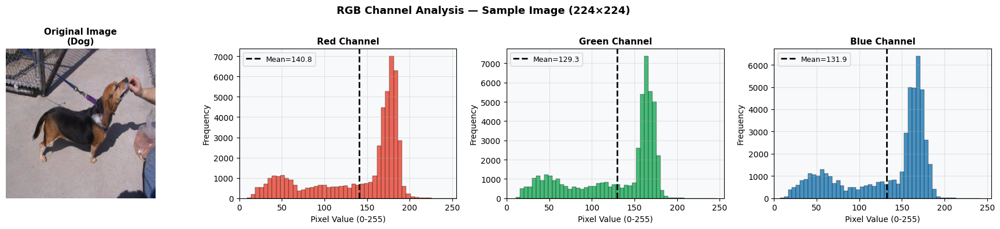

In [10]:
sample_path = df['filepath'].iloc[0]
sample_img  = np.array(Image.open(sample_path).convert('RGB').resize(IMG_SIZE))
channel_labels = ['Red', 'Green', 'Blue']
channel_colors = ['#E74C3C', '#27AE60', '#2980B9']

fig, axes = plt.subplots(1, 4, figsize=(18, 4))
fig.suptitle('RGB Channel Analysis — Sample Image (224×224)', fontsize=13, fontweight='bold')

axes[0].imshow(sample_img)
axes[0].set_title(f'Original Image\n({df["class_name"].iloc[0]})', fontsize=11, fontweight='bold')
axes[0].axis('off')

for i, (label, color) in enumerate(zip(channel_labels, channel_colors)):
    axes[i+1].hist(sample_img[:, :, i].ravel(), bins=50, color=color, alpha=0.85, edgecolor='black', linewidth=0.3)
    axes[i+1].set_title(f'{label} Channel', fontsize=11, fontweight='bold')
    axes[i+1].set_xlabel('Pixel Value (0-255)', fontsize=10)
    axes[i+1].set_ylabel('Frequency', fontsize=10)
    axes[i+1].set_xlim(0, 255)
    mean_val = sample_img[:, :, i].mean()
    axes[i+1].axvline(mean_val, color='black', linestyle='--', linewidth=2, label=f'Mean={mean_val:.1f}')
    axes[i+1].legend(fontsize=9)

plt.tight_layout()
plt.savefig('rgb_channels.png', dpi=150, bbox_inches='tight')
plt.show()

---
## Feature Engineering
Load all images, resize to 224×224, normalise pixel values from [0,255] to [0.0,1.0], and encode class labels as integers.

In [11]:
def load_and_preprocess(dataframe, img_size=(224, 224)):
    images       = []
    valid_indices = []
    total = len(dataframe)
    for count, (idx, row) in enumerate(dataframe.iterrows()):
        try:
            img = Image.open(row['filepath']).convert('RGB')
            img = img.resize(img_size, Image.LANCZOS)
            img_array = np.array(img, dtype=np.float32) / 255.0
            images.append(img_array)
            valid_indices.append(idx)
        except Exception:
            pass
        if (count + 1) % 100 == 0:
            print(f'  Processed {count+1}/{total} images...')
    return np.array(images, dtype=np.float32), valid_indices

print(f'Loading {len(df)} images, resizing to {IMG_SIZE}, normalising to [0, 1]...')
X, valid_idx = load_and_preprocess(df, IMG_SIZE)
y            = df.loc[valid_idx, 'label'].values
df_valid     = df.loc[valid_idx].reset_index(drop=True)

print(f'\nFeature matrix X : shape={X.shape}, dtype={X.dtype}')
print(f'Label vector   y : shape={y.shape}, unique={np.unique(y)}')
print(f'Pixel range      : min={X.min():.4f}, max={X.max():.4f}, mean={X.mean():.4f}')
print(f'Memory usage     : {X.nbytes / (1024**2):.1f} MB')

Loading 1000 images, resizing to (224, 224), normalising to [0, 1]...
  Processed 100/1000 images...
  Processed 200/1000 images...
  Processed 300/1000 images...
  Processed 400/1000 images...
  Processed 500/1000 images...
  Processed 600/1000 images...
  Processed 700/1000 images...
  Processed 800/1000 images...
  Processed 900/1000 images...
  Processed 1000/1000 images...

Feature matrix X : shape=(1000, 224, 224, 3), dtype=float32
Label vector   y : shape=(1000,), unique=[0 1]
Pixel range      : min=0.0000, max=1.0000, mean=0.4531
Memory usage     : 574.2 MB


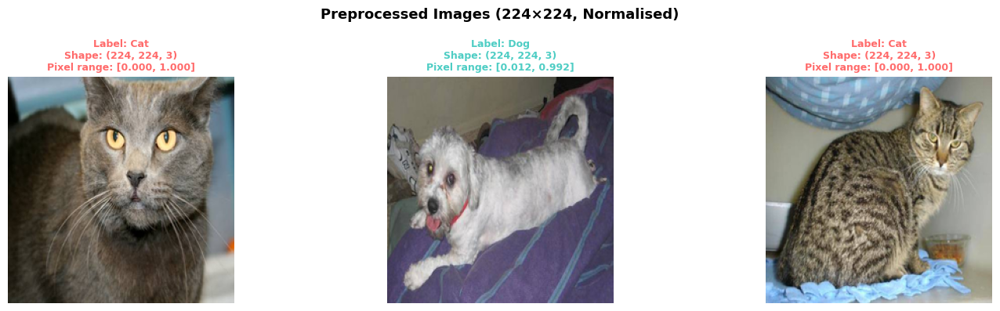

In [12]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
fig.suptitle('Preprocessed Images (224×224, Normalised)', fontsize=13, fontweight='bold')

sample_indices = random.sample(range(len(X)), 3)
for plot_idx, sample_idx in enumerate(sample_indices):
    axes[plot_idx].imshow(X[sample_idx])
    label_str = CLASS_NAMES[int(y[sample_idx])]
    color     = '#FF6B6B' if y[sample_idx] == 0 else '#4ECDC4'
    axes[plot_idx].set_title(f'Label: {label_str}\nShape: {X[sample_idx].shape}\nPixel range: [{X[sample_idx].min():.3f}, {X[sample_idx].max():.3f}]',
                             fontsize=9, color=color, fontweight='bold')
    axes[plot_idx].axis('off')

plt.tight_layout()
plt.savefig('preprocessed_samples.png', dpi=150, bbox_inches='tight')
plt.show()

---
##  Data Splitting
Split the dataset into **70% Train / 15% Validation / 15% Test** using stratified sampling to preserve class balance in every split.

In [13]:
X_trainval, X_test, y_trainval, y_test = train_test_split(
    X, y, test_size=0.15, random_state=RANDOM_STATE, stratify=y)

X_train, X_val, y_train, y_val = train_test_split(
    X_trainval, y_trainval, test_size=0.1765, random_state=RANDOM_STATE, stratify=y_trainval)

print('Data Split Summary')
print('='*65)
print(f'{"Split":<15} {"Total":>8} {"Cats (0)":>10} {"Dogs (1)":>10} {"Cat %":>8} {"Dog %":>8}')
print('-'*65)
for name, X_s, y_s in [("Training", X_train, y_train), ("Validation", X_val, y_val), ("Test", X_test, y_test)]:
    n_cats = int(np.sum(y_s == 0))
    n_dogs = int(np.sum(y_s == 1))
    total  = len(y_s)
    print(f'{name:<15} {total:>8} {n_cats:>10} {n_dogs:>10} {n_cats/total*100:>7.1f}% {n_dogs/total*100:>7.1f}%')
print('='*65)
print(f'\nX_train : {X_train.shape}   y_train : {y_train.shape}')
print(f'X_val   : {X_val.shape}     y_val   : {y_val.shape}')
print(f'X_test  : {X_test.shape}    y_test  : {y_test.shape}')

Data Split Summary
Split              Total   Cats (0)   Dogs (1)    Cat %    Dog %
-----------------------------------------------------------------
Training             699        349        350    49.9%    50.1%
Validation           151         76         75    50.3%    49.7%
Test                 150         75         75    50.0%    50.0%

X_train : (699, 224, 224, 3)   y_train : (699,)
X_val   : (151, 224, 224, 3)     y_val   : (151,)
X_test  : (150, 224, 224, 3)    y_test  : (150,)


Data generators created.
Train generator  : 699 images, batch_size=32
Val generator    : 151 images, batch_size=32


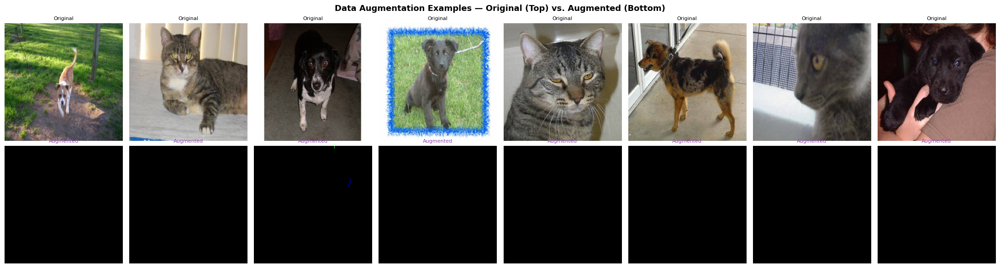

In [14]:
train_datagen = ImageDataGenerator(
    horizontal_flip  =True,
    rotation_range   =20,
    zoom_range       =0.15,
    width_shift_range=0.10,
    height_shift_range=0.10,
    brightness_range =[0.8, 1.2],
    shear_range      =0.10,
    fill_mode        ='nearest'
)

val_datagen = ImageDataGenerator()

train_generator = train_datagen.flow(X_train, y_train, batch_size=BATCH_SIZE, seed=RANDOM_STATE)
val_generator   = val_datagen.flow(X_val, y_val, batch_size=BATCH_SIZE, shuffle=False)

print('Data generators created.')
print(f'Train generator  : {len(X_train)} images, batch_size={BATCH_SIZE}')
print(f'Val generator    : {len(X_val)} images, batch_size={BATCH_SIZE}')

fig, axes = plt.subplots(2, 8, figsize=(22, 6))
fig.suptitle('Data Augmentation Examples — Original (Top) vs. Augmented (Bottom)', fontsize=13, fontweight='bold')

original_sample   = X_train[:8].copy()
aug_x, _ = next(train_datagen.flow(original_sample, np.zeros(8), batch_size=8, seed=0))

for i in range(8):
    axes[0, i].imshow(np.clip(original_sample[i], 0, 1))
    axes[0, i].axis('off')
    axes[0, i].set_title('Original', fontsize=8)
    axes[1, i].imshow(np.clip(aug_x[i], 0, 1))
    axes[1, i].axis('off')
    axes[1, i].set_title('Augmented', fontsize=8, color='#8E44AD')

plt.tight_layout()
plt.savefig('augmentation_examples.png', dpi=150, bbox_inches='tight')
plt.show()

---
##  Model Selection
Two architectures are defined:
1. **Custom CNN** — four convolutional blocks built from scratch
2. **MobileNetV2** — ImageNet pre-trained base with a custom classification head (Transfer Learning)

In [15]:
def build_custom_cnn(input_shape=(224, 224, 3)):
    model = models.Sequential(name='Custom_CNN')
    model.add(layers.Input(shape=input_shape))

    model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Flatten())
    model.add(layers.Dense(256, activation='relu',
                           kernel_regularizer=keras.regularizers.l2(0.001)))
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

cnn_model = build_custom_cnn()
cnn_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    loss='binary_crossentropy',
    metrics=['accuracy']
)
cnn_model.summary()
total_params_cnn = cnn_model.count_params()
print(f'\nTotal parameters : {total_params_cnn:,}')

Model: "Custom_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 224, 224, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 56, 56, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 28, 28, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 28, 28, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │       6,422,784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             257 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,665,281 (25.43 MB)

 Trainable params: 6,664,577 (25.42 MB)

 Non-trainable params: 704 (2.75 KB)


Total parameters : 6,665,281


In [16]:
def build_mobilenetv2(input_shape=(224, 224, 3), freeze_base=True):
    base_model = MobileNetV2(
        weights     ='imagenet',
        include_top =False,
        input_shape =input_shape
    )
    base_model.trainable = not freeze_base

    inputs  = keras.Input(shape=input_shape)
    x       = base_model(inputs, training=False)
    x       = layers.GlobalAveragePooling2D()(x)
    x       = layers.Dense(128, activation='relu')(x)
    x       = layers.BatchNormalization()(x)
    x       = layers.Dropout(0.3)(x)
    outputs = layers.Dense(1, activation='sigmoid')(x)

    model = keras.Model(inputs, outputs, name='MobileNetV2_Transfer')
    return model, base_model

transfer_model, base_model = build_mobilenetv2(freeze_base=True)
transfer_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    loss='binary_crossentropy',
    metrics=['accuracy']
)
transfer_model.summary()

trainable_params    = sum([tf.size(v).numpy() for v in transfer_model.trainable_variables])
non_trainable_params = sum([tf.size(v).numpy() for v in transfer_model.non_trainable_variables])
print(f'\nTrainable parameters     : {trainable_params:,}')
print(f'Non-trainable parameters : {non_trainable_params:,}')
print(f'Total MobileNetV2 layers : {len(base_model.layers)}')

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


Model: "MobileNetV2_Transfer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │         163,968 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,422,593 (9.24 MB)

 Trainable params: 164,353 (642.00 KB)

 Non-trainable params: 2,258,240 (8.61 MB)


Trainable parameters     : 164,353
Non-trainable parameters : 2,258,242
Total MobileNetV2 layers : 154


---
## Model Training
Train both models with data augmentation, EarlyStopping, ReduceLROnPlateau, and ModelCheckpoint callbacks.

In [17]:
cnn_callbacks_list = [
    callbacks.EarlyStopping(
        monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
    callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7, verbose=1),
    callbacks.ModelCheckpoint(
        'best_cnn_model.keras', monitor='val_accuracy', save_best_only=True, verbose=0)
]

steps_per_epoch = len(X_train) // BATCH_SIZE
val_steps       = len(X_val) // BATCH_SIZE

print('Training Custom CNN...')
print(f'Steps per epoch  : {steps_per_epoch}')
print(f'Validation steps : {val_steps}')
print(f'Max epochs       : 20')
print('-' * 50)

cnn_history = cnn_model.fit(
    train_generator,
    steps_per_epoch =steps_per_epoch,
    epochs          =20,
    validation_data =val_generator,
    validation_steps=val_steps,
    callbacks       =cnn_callbacks_list,
    verbose         =1
)

print(f'\nTraining complete. Epochs trained: {len(cnn_history.history["accuracy"])}')
print(f'Best val_accuracy : {max(cnn_history.history["val_accuracy"]):.4f}')
print(f'Best val_loss     : {min(cnn_history.history["val_loss"]):.4f}')

Training Custom CNN...
Steps per epoch  : 21
Validation steps : 4
Max epochs       : 20
--------------------------------------------------
Epoch 1/20
21/21 ━━━━━━━━━━━━━━━━━━━━ 94s 4s/step - accuracy: 0.5045 - loss: 8.1573 - val_accuracy: 0.5156 - val_loss: 19.5823 - learning_rate: 0.0010
Epoch 2/20
21/21 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - accuracy: 0.5556 - loss: 3.6068 - val_accuracy: 0.5078 - val_loss: 15.3314 - learning_rate: 0.0010
Epoch 3/20
21/21 ━━━━━━━━━━━━━━━━━━━━ 86s 4s/step - accuracy: 0.4948 - loss: 6.6892 - val_accuracy: 0.5234 - val_loss: 21.9145 - learning_rate: 0.0010
Epoch 4/20
21/21 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - accuracy: 0.5312 - loss: 2.8470 - val_accuracy: 0.5156 - val_loss: 18.6322 - learning_rate: 0.0010
Epoch 5/20
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.5147 - loss: 4.5202
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
21/21 ━━━━━━━━━━━━━━━━━━━━ 86s 4s/step - accuracy: 0.4933 - loss: 4.9900 - val_accuracy: 0.515

In [18]:
transfer_callbacks_list = [
    callbacks.EarlyStopping(
        monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
    callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7, verbose=1),
    callbacks.ModelCheckpoint(
        'best_transfer_model.keras', monitor='val_accuracy', save_best_only=True, verbose=0)
]

print('Training MobileNetV2 (Phase 1 — Feature Extraction, base frozen)...')
print(f'Steps per epoch  : {steps_per_epoch}')
print(f'Validation steps : {val_steps}')
print(f'Max epochs       : 20')
print('-' * 50)

transfer_history = transfer_model.fit(
    train_generator,
    steps_per_epoch =steps_per_epoch,
    epochs          =20,
    validation_data =val_generator,
    validation_steps=val_steps,
    callbacks       =transfer_callbacks_list,
    verbose         =1
)

print(f'\nTraining complete. Epochs trained: {len(transfer_history.history["accuracy"])}')
print(f'Best val_accuracy : {max(transfer_history.history["val_accuracy"]):.4f}')
print(f'Best val_loss     : {min(transfer_history.history["val_loss"]):.4f}')

Training MobileNetV2 (Phase 1 — Feature Extraction, base frozen)...
Steps per epoch  : 21
Validation steps : 4
Max epochs       : 20
--------------------------------------------------
Epoch 1/20
21/21 ━━━━━━━━━━━━━━━━━━━━ 48s 2s/step - accuracy: 0.5307 - loss: 0.8011 - val_accuracy: 0.5156 - val_loss: 0.9675 - learning_rate: 0.0010
Epoch 2/20
21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 195ms/step - accuracy: 0.4375 - loss: 0.7141 - val_accuracy: 0.5156 - val_loss: 0.9199 - learning_rate: 0.0010
Epoch 3/20
21/21 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - accuracy: 0.4843 - loss: 0.7810 - val_accuracy: 0.5938 - val_loss: 0.6890 - learning_rate: 0.0010
Epoch 4/20
21/21 ━━━━━━━━━━━━━━━━━━━━ 10s 434ms/step - accuracy: 0.5000 - loss: 0.6980 - val_accuracy: 0.5859 - val_loss: 0.6953 - learning_rate: 0.0010
Epoch 5/20
21/21 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - accuracy: 0.5052 - loss: 0.7746 - val_accuracy: 0.5469 - val_loss: 0.7264 - learning_rate: 0.0010
Epoch 6/20
 1/21 ━━━━━━━━━━━━━━━━━━━━ 17s 887ms/step - accura

---
## Model Evaluation
Evaluate both models on the held-out test set. Plot accuracy/loss curves, confusion matrix, ROC-AUC curve, and prediction probability distributions.

In [21]:
def plot_training_history(history, title):
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle(title, fontsize=14, fontweight='bold')

    epochs_range = range(1, len(history.history['accuracy']) + 1)

    axes[0].plot(epochs_range, history.history['accuracy'],
                 color='#2980B9', lw=2.5, marker='o', markersize=4, label='Training')
    axes[0].plot(epochs_range, history.history['val_accuracy'],
                 color='#E74C3C', lw=2.5, marker='s', markersize=4,
                 linestyle='--', label='Validation')
    axes[0].fill_between(epochs_range, history.history['accuracy'],
                         history.history['val_accuracy'], alpha=0.08, color='gray')
    axes[0].set_title('Accuracy over Epochs', fontsize=12, fontweight='bold')
    axes[0].set_xlabel('Epoch', fontsize=11)
    axes[0].set_ylabel('Accuracy', fontsize=11)
    axes[0].legend(fontsize=11)
    axes[0].set_ylim(0, 1.05)

    axes[1].plot(epochs_range, history.history['loss'],
                 color='#2980B9', lw=2.5, marker='o', markersize=4, label='Training')
    axes[1].plot(epochs_range, history.history['val_loss'],
                 color='#E74C3C', lw=2.5, marker='s', markersize=4,
                 linestyle='--', label='Validation')
    axes[1].set_title('Loss over Epochs', fontsize=12, fontweight='bold')
    axes[1].set_xlabel('Epoch', fontsize=11)
    axes[1].set_ylabel('Binary Cross-Entropy Loss', fontsize=11)
    axes[1].legend(fontsize=11)

    plt.tight_layout()
    safe_name = title.replace(' ', '_').replace('(', '').replace(')', '').replace('—', '')
    plt.savefig(f'{safe_name}_curves.png', dpi=150, bbox_inches='tight')
    plt.show()


def evaluate_model(model, X_test, y_test, model_name='Model'):
    y_proba = model.predict(X_test, verbose=0).flatten()
    y_pred  = (y_proba >= 0.5).astype(int)

    test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)
    auc_score           = roc_auc_score(y_test, y_proba)

    print(f'\n{"="*55}')
    print(f'  {model_name} — Test Set Results')
    print(f'{"="*55}')
    print(f'  Test Accuracy : {test_acc:.4f}  ({test_acc*100:.2f}%)')
    print(f'  Test Loss     : {test_loss:.4f}')
    print(f'  AUC-ROC       : {auc_score:.4f}')
    print(f'{"="*55}')
    print(f'\nClassification Report:')
    print(classification_report(y_test, y_pred, target_names=['Cat', 'Dog']))

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle(f'{model_name} — Test Evaluation', fontsize=14, fontweight='bold')

    cm = confusion_matrix(y_test, y_pred)
    group_labels  = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
    group_pcts    = [f'{v/cm.sum()*100:.1f}%' for v in cm.flatten()]
    annot_labels  = np.array([f'{v}\n{p}' for v, p in zip(cm.flatten(), group_pcts)]).reshape(2, 2)
    sns.heatmap(cm, annot=annot_labels, fmt='', cmap='Blues', ax=axes[0],
                xticklabels=['Cat', 'Dog'], yticklabels=['Cat', 'Dog'],
                linewidths=1, linecolor='black', annot_kws={'size': 12, 'weight': 'bold'})
    axes[0].set_title('Confusion Matrix', fontsize=12, fontweight='bold')
    axes[0].set_xlabel('Predicted Label', fontsize=11)
    axes[0].set_ylabel('True Label', fontsize=11)

    fpr, tpr, _ = roc_curve(y_test, y_proba)
    axes[1].plot(fpr, tpr, color='#2980B9', lw=2.5, label=f'ROC (AUC = {auc_score:.3f})')
    axes[1].plot([0, 1], [0, 1], 'k--', lw=1.5, label='Random Classifier')
    axes[1].fill_between(fpr, tpr, alpha=0.10, color='#2980B9')
    axes[1].set_title('ROC Curve', fontsize=12, fontweight='bold')
    axes[1].set_xlabel('False Positive Rate', fontsize=11)
    axes[1].set_ylabel('True Positive Rate', fontsize=11)
    axes[1].legend(fontsize=10)

    axes[2].hist(y_proba[y_test == 0], bins=25, alpha=0.75, color='#FF6B6B',
                 label='Cat (True=0)', edgecolor='black', linewidth=0.5)
    axes[2].hist(y_proba[y_test == 1], bins=25, alpha=0.75, color='#4ECDC4',
                 label='Dog (True=1)', edgecolor='black', linewidth=0.5)
    axes[2].axvline(x=0.5, color='black', linestyle='--', linewidth=2,
                    label='Decision threshold = 0.5')
    axes[2].set_title('Prediction Probability Distribution', fontsize=12, fontweight='bold')
    axes[2].set_xlabel('Predicted P(Dog)', fontsize=11)
    axes[2].set_ylabel('Count', fontsize=11)
    axes[2].legend(fontsize=9)

    plt.tight_layout()
    safe_name = model_name.replace(' ', '_').replace('(', '').replace(')', '')
    plt.savefig(f'{safe_name}_evaluation.png', dpi=150, bbox_inches='tight')
    plt.show()

    return test_acc, test_loss, auc_score, y_pred, y_proba


print('Evaluation helper functions defined.')

Evaluation helper functions defined.


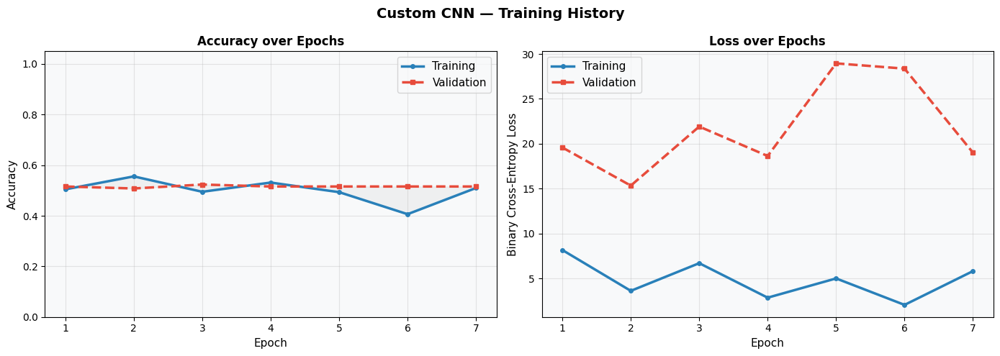


  Custom CNN — Test Set Results
  Test Accuracy : 0.5000  (50.00%)
  Test Loss     : 16.8130
  AUC-ROC       : 0.4290

Classification Report:
              precision    recall  f1-score   support

         Cat       0.50      0.99      0.66        75
         Dog       0.50      0.01      0.03        75

    accuracy                           0.50       150
   macro avg       0.50      0.50      0.34       150
weighted avg       0.50      0.50      0.34       150



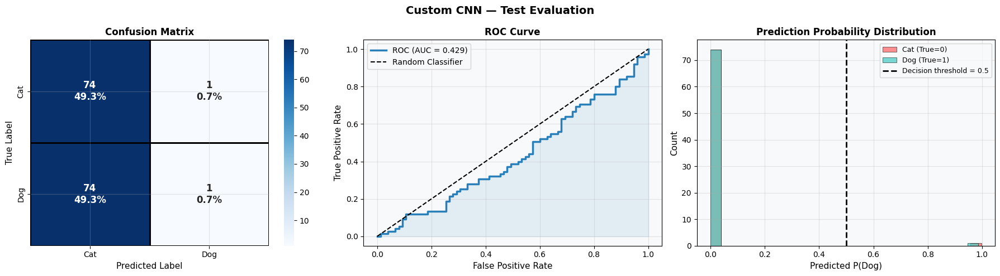

In [20]:
plot_training_history(cnn_history, 'Custom CNN — Training History')

cnn_acc, cnn_loss, cnn_auc, cnn_pred, cnn_proba = evaluate_model(
    cnn_model, X_test, y_test, 'Custom CNN')

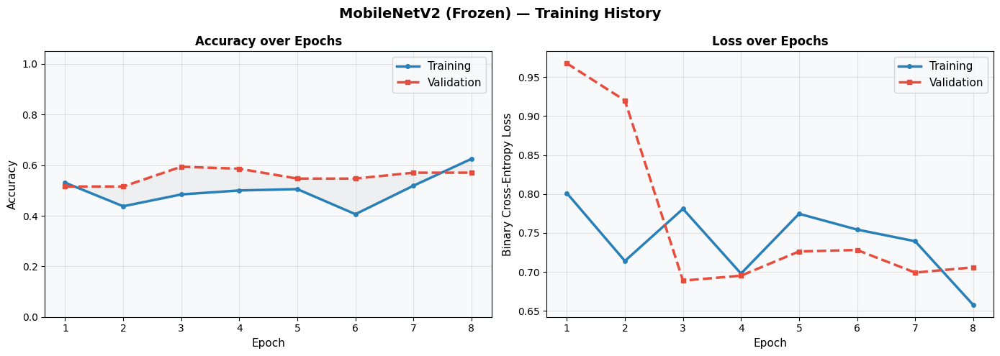


  MobileNetV2 (Frozen Base) — Test Set Results
  Test Accuracy : 0.5333  (53.33%)
  Test Loss     : 0.7341
  AUC-ROC       : 0.6793

Classification Report:
              precision    recall  f1-score   support

         Cat       0.52      0.93      0.67        75
         Dog       0.67      0.13      0.22        75

    accuracy                           0.53       150
   macro avg       0.59      0.53      0.44       150
weighted avg       0.59      0.53      0.44       150



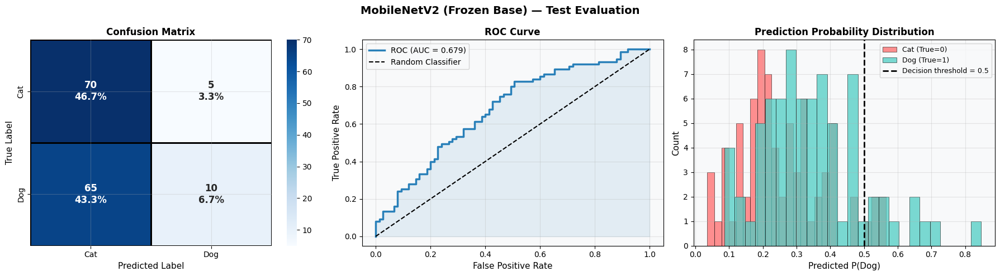

In [22]:
plot_training_history(transfer_history, 'MobileNetV2 (Frozen) — Training History')

trans_acc, trans_loss, trans_auc, trans_pred, trans_proba = evaluate_model(
    transfer_model, X_test, y_test, 'MobileNetV2 (Frozen Base)')

---
## Model Improvement: Fine-Tuning MobileNetV2
Unfreeze the top 30 layers of MobileNetV2 and fine-tune with a very small learning rate (1e-5) to further adapt pre-trained features to the Cats vs. Dogs task.

In [23]:
base_model.trainable = True

LAYERS_TO_FREEZE = len(base_model.layers) - 30
for layer in base_model.layers[:LAYERS_TO_FREEZE]:
    layer.trainable = False

trainable_layers = sum(1 for l in base_model.layers if l.trainable)
frozen_layers    = sum(1 for l in base_model.layers if not l.trainable)
trainable_params = sum([tf.size(v).numpy() for v in transfer_model.trainable_variables])

print(f'Fine-Tuning Configuration:')
print(f'  Total base layers    : {len(base_model.layers)}')
print(f'  Frozen layers        : {frozen_layers}')
print(f'  Unfrozen layers      : {trainable_layers}')
print(f'  Trainable parameters : {trainable_params:,}')

transfer_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

finetune_callbacks_list = [
    callbacks.EarlyStopping(
        monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
    callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.5, patience=3, min_lr=1e-8, verbose=1),
    callbacks.ModelCheckpoint(
        'best_finetuned_model.keras', monitor='val_accuracy', save_best_only=True, verbose=0)
]

print(f'\nFine-tuning MobileNetV2 (Phase 2 — top {trainable_layers} layers unfrozen)...')
print('-' * 50)

finetune_history = transfer_model.fit(
    train_generator,
    steps_per_epoch =steps_per_epoch,
    epochs          =10,
    validation_data =val_generator,
    validation_steps=val_steps,
    callbacks       =finetune_callbacks_list,
    verbose         =1
)

print(f'\nFine-tuning complete. Epochs: {len(finetune_history.history["accuracy"])}')
print(f'Best val_accuracy : {max(finetune_history.history["val_accuracy"]):.4f}')

Fine-Tuning Configuration:
  Total base layers    : 154
  Frozen layers        : 124
  Unfrozen layers      : 30
  Trainable parameters : 1,690,753

Fine-tuning MobileNetV2 (Phase 2 — top 30 layers unfrozen)...
--------------------------------------------------
Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.4528 - loss: 0.8488 - val_accuracy: 0.6094 - val_loss: 0.6752 - learning_rate: 1.0000e-05
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 6s 218ms/step - accuracy: 0.3438 - loss: 0.9478 - val_accuracy: 0.6094 - val_loss: 0.6753 - learning_rate: 1.0000e-05
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 72s 2s/step - accuracy: 0.4918 - loss: 0.7786 - val_accuracy: 0.6094 - val_loss: 0.6661 - learning_rate: 1.0000e-05
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 189ms/step - accuracy: 0.5625 - loss: 0.7592 - val_accuracy: 0.6094 - val_loss: 0.6652 - learning_rate: 1.0000e-05
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.5112 - loss: 0.7458 - val_accuracy: 0.6406 - val_loss:

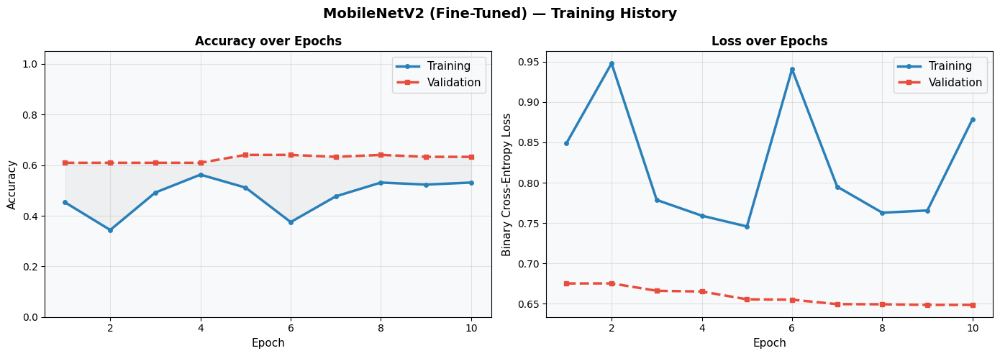


  MobileNetV2 (Fine-Tuned) — Test Set Results
  Test Accuracy : 0.5867  (58.67%)
  Test Loss     : 0.7172
  AUC-ROC       : 0.7097

Classification Report:
              precision    recall  f1-score   support

         Cat       0.55      0.89      0.68        75
         Dog       0.72      0.28      0.40        75

    accuracy                           0.59       150
   macro avg       0.64      0.59      0.54       150
weighted avg       0.64      0.59      0.54       150



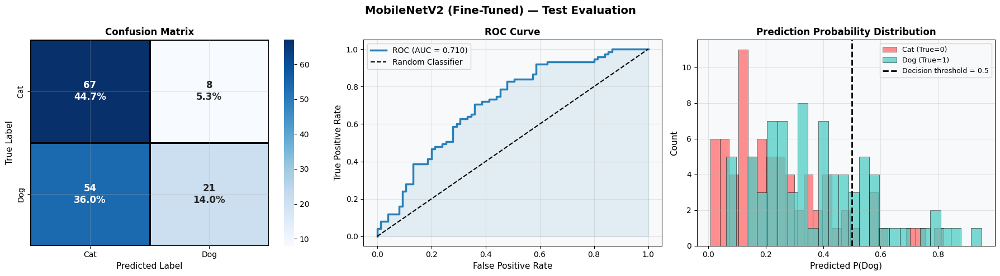

In [24]:
plot_training_history(finetune_history, 'MobileNetV2 (Fine-Tuned) — Training History')

fine_acc, fine_loss, fine_auc, fine_pred, fine_proba = evaluate_model(
    transfer_model, X_test, y_test, 'MobileNetV2 (Fine-Tuned)')

Model Comparison Summary
                   Model  Test Accuracy (%)  Test Loss  AUC-ROC
              Custom CNN              50.00    16.8130   0.4290
    MobileNetV2 (Frozen)              53.33     0.7341   0.6793
MobileNetV2 (Fine-Tuned)              58.67     0.7172   0.7097


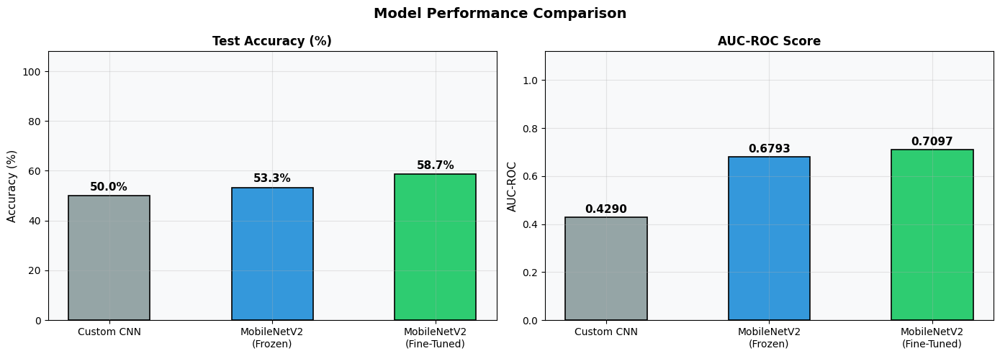

In [25]:
comparison_df = pd.DataFrame({
    'Model'            : ['Custom CNN', 'MobileNetV2 (Frozen)', 'MobileNetV2 (Fine-Tuned)'],
    'Test Accuracy (%)'  : [round(cnn_acc * 100, 2), round(trans_acc * 100, 2), round(fine_acc * 100, 2)],
    'Test Loss'          : [round(cnn_loss, 4), round(trans_loss, 4), round(fine_loss, 4)],
    'AUC-ROC'            : [round(cnn_auc, 4), round(trans_auc, 4), round(fine_auc, 4)]
})

print('Model Comparison Summary')
print('='*70)
print(comparison_df.to_string(index=False))
print('='*70)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Model Performance Comparison', fontsize=14, fontweight='bold')

palette   = ['#95A5A6', '#3498DB', '#2ECC71']
x_labels  = ['Custom CNN', 'MobileNetV2\n(Frozen)', 'MobileNetV2\n(Fine-Tuned)']

bars1 = axes[0].bar(x_labels, comparison_df['Test Accuracy (%)'],
                    color=palette, edgecolor='black', linewidth=1.2, width=0.5)
axes[0].set_title('Test Accuracy (%)', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Accuracy (%)', fontsize=11)
axes[0].set_ylim(0, 108)
for bar, val in zip(bars1, comparison_df['Test Accuracy (%)']):
    axes[0].text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 1.2,
                 f'{val:.1f}%', ha='center', va='bottom', fontweight='bold', fontsize=11)

bars2 = axes[1].bar(x_labels, comparison_df['AUC-ROC'],
                    color=palette, edgecolor='black', linewidth=1.2, width=0.5)
axes[1].set_title('AUC-ROC Score', fontsize=12, fontweight='bold')
axes[1].set_ylabel('AUC-ROC', fontsize=11)
axes[1].set_ylim(0, 1.12)
for bar, val in zip(bars2, comparison_df['AUC-ROC']):
    axes[1].text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.01,
                 f'{val:.4f}', ha='center', va='bottom', fontweight='bold', fontsize=11)

plt.tight_layout()
plt.savefig('model_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

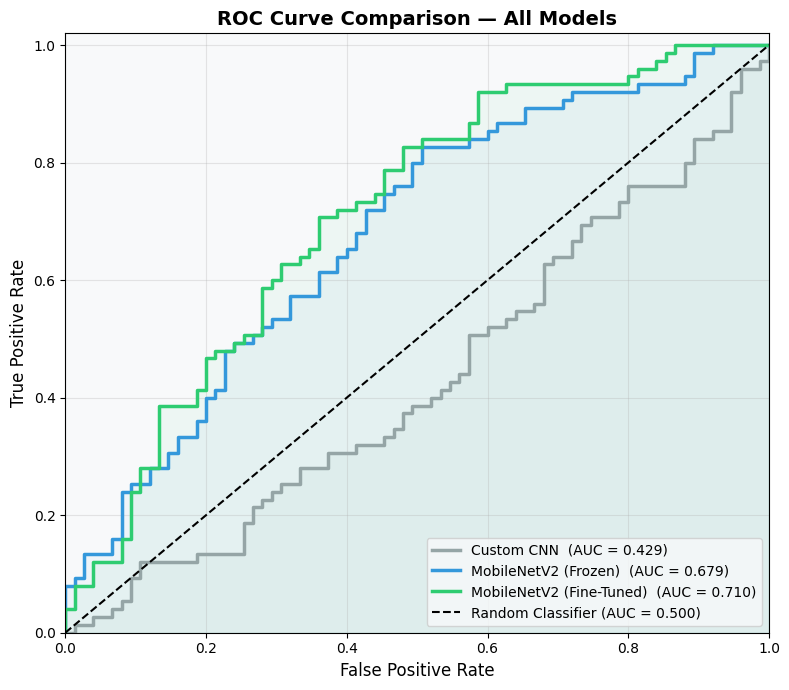

In [26]:
fig, ax = plt.subplots(figsize=(8, 7))
ax.set_title('ROC Curve Comparison — All Models', fontsize=14, fontweight='bold')

model_probas = [cnn_proba, trans_proba, fine_proba]
model_names  = ['Custom CNN', 'MobileNetV2 (Frozen)', 'MobileNetV2 (Fine-Tuned)']
model_colors = ['#95A5A6', '#3498DB', '#2ECC71']

for proba, name, color in zip(model_probas, model_names, model_colors):
    fpr, tpr, _ = roc_curve(y_test, proba)
    auc_val     = roc_auc_score(y_test, proba)
    ax.plot(fpr, tpr, lw=2.5, color=color, label=f'{name}  (AUC = {auc_val:.3f})')
    ax.fill_between(fpr, tpr, alpha=0.05, color=color)

ax.plot([0, 1], [0, 1], 'k--', lw=1.5, label='Random Classifier (AUC = 0.500)')
ax.set_xlabel('False Positive Rate', fontsize=12)
ax.set_ylabel('True Positive Rate', fontsize=12)
ax.legend(fontsize=10, loc='lower right')
ax.set_xlim(0, 1)
ax.set_ylim(0, 1.02)

plt.tight_layout()
plt.savefig('roc_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

---
## Deployment: Inference Function & Predictions Visualisation
Implement a `predict_image()` function for single-image inference and visualise predictions on the test set with confidence scores.

In [27]:
def predict_image(image_path, model, img_size=(224, 224), class_names=['Cat', 'Dog']):
    img        = Image.open(image_path).convert('RGB')
    img_resized = img.resize(img_size, Image.LANCZOS)
    img_array  = np.array(img_resized, dtype=np.float32) / 255.0
    img_batch  = np.expand_dims(img_array, axis=0)
    probability = float(model.predict(img_batch, verbose=0)[0][0])
    pred_idx   = int(probability >= 0.5)
    pred_class = class_names[pred_idx]
    confidence = probability * 100 if pred_idx == 1 else (1 - probability) * 100
    return pred_class, confidence, probability


print('Testing predict_image() on 10 sample images...')
print('='*75)
print(f'{"Filename":<30} {"True Label":<12} {"Predicted":<12} {"Confidence":>12} {"Correct?":>10}')
print('-'*75)

for i in range(10):
    filepath   = df_valid['filepath'].iloc[i]
    true_label = df_valid['class_name'].iloc[i]
    pred, conf, _ = predict_image(filepath, transfer_model)
    correct    = '✓' if pred == true_label else '✗'
    print(f'{os.path.basename(filepath):<30} {true_label:<12} {pred:<12} {conf:>10.2f}% {correct:>10}')

print('='*75)

Testing predict_image() on 10 sample images...
Filename                       True Label   Predicted      Confidence   Correct?
---------------------------------------------------------------------------
dog.162.jpg                    Dog          Dog               57.57%          ✓
dog.314.jpg                    Dog          Cat               91.78%          ✗
dog.121.jpg                    Dog          Cat               78.56%          ✗
dog.485.jpg                    Dog          Dog               57.15%          ✓
cat.3636.jpg                   Cat          Cat               97.63%          ✓
dog.493.jpg                    Dog          Dog               61.81%          ✓
dog.96.jpg                     Dog          Dog               72.87%          ✓
dog.273.jpg                    Dog          Cat               64.94%          ✗
dog.231.jpg                    Dog          Cat               68.76%          ✗
cat.3720.jpg                   Cat          Cat               66.48%        

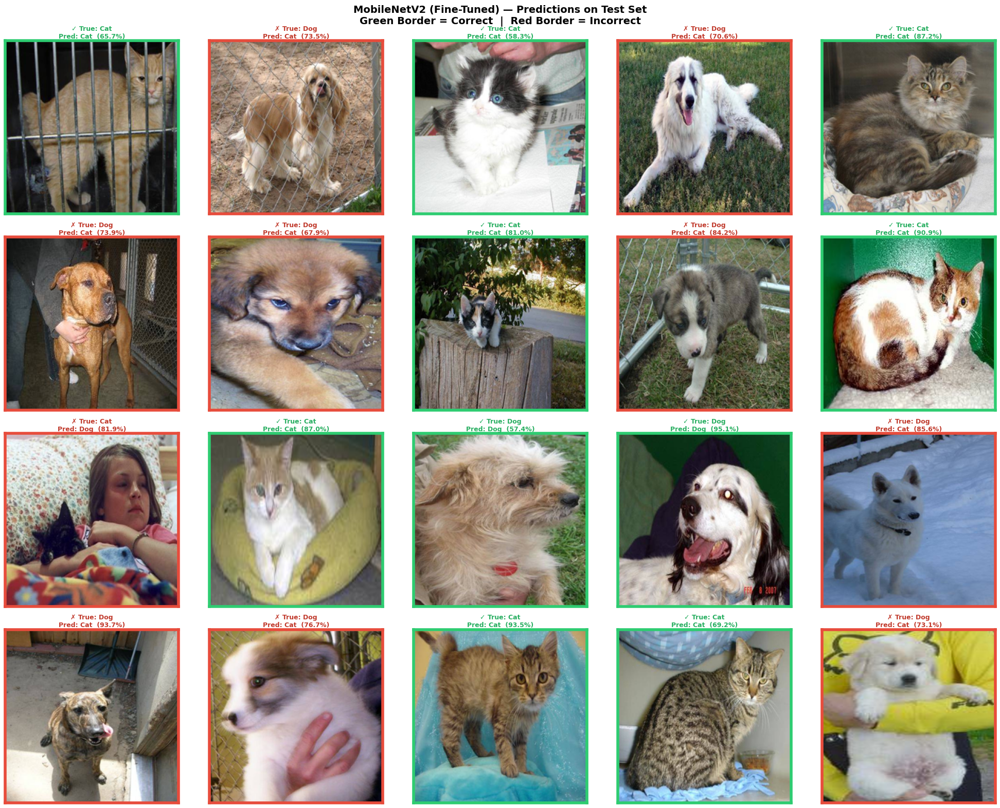

Correct predictions in grid : 10 / 20  (50%)


In [28]:
fig, axes = plt.subplots(4, 5, figsize=(20, 16))
fig.suptitle('MobileNetV2 (Fine-Tuned) — Predictions on Test Set\n'
             'Green Border = Correct  |  Red Border = Incorrect',
             fontsize=14, fontweight='bold')

test_indices = random.sample(range(len(X_test)), 20)

for plot_idx, test_idx in enumerate(test_indices):
    ax           = axes[plot_idx // 5][plot_idx % 5]
    img_arr      = X_test[test_idx]
    true_idx     = int(y_test[test_idx])
    true_label   = CLASS_NAMES[true_idx]

    img_batch    = np.expand_dims(img_arr, axis=0)
    prob         = float(transfer_model.predict(img_batch, verbose=0)[0][0])
    pred_idx     = int(prob >= 0.5)
    pred_label   = CLASS_NAMES[pred_idx]
    confidence   = prob * 100 if pred_idx == 1 else (1 - prob) * 100
    is_correct   = (pred_label == true_label)

    ax.imshow(np.clip(img_arr, 0, 1))
    border_color = '#2ECC71' if is_correct else '#E74C3C'
    title_color  = '#27AE60' if is_correct else '#C0392B'
    status_icon  = '✓' if is_correct else '✗'

    for spine in ax.spines.values():
        spine.set_edgecolor(border_color)
        spine.set_linewidth(4)
        spine.set_visible(True)

    ax.set_title(f'{status_icon} True: {true_label}\nPred: {pred_label}  ({confidence:.1f}%)',
                 fontsize=9, color=title_color, fontweight='bold', pad=4)
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.savefig('predictions_grid.png', dpi=150, bbox_inches='tight')
plt.show()

correct_preds = sum(1 for idx in test_indices
                    if CLASS_NAMES[int(transfer_model.predict(
                        np.expand_dims(X_test[idx], 0), verbose=0)[0][0] >= 0.5)] ==
                    CLASS_NAMES[int(y_test[idx])])
print(f'Correct predictions in grid : {correct_preds} / 20  ({correct_preds/20*100:.0f}%)')

In [29]:
transfer_model.save('final_cat_dog_model.keras')

print('\n' + '='*65)
print('         FINAL PROJECT RESULTS SUMMARY')
print('='*65)
print(f'{"Model":<28} {"Test Accuracy":>14} {"AUC-ROC":>10}')
print('-'*65)
for _, row in comparison_df.iterrows():
    print(f"{row['Model']:<28} {row['Test Accuracy (%)']:>12.2f}%  {row['AUC-ROC']:>10.4f}")
print('='*65)
print(f'\n  Best Model       : MobileNetV2 (Fine-Tuned)')
print(f'  Test Accuracy    : {fine_acc*100:.2f}%')
print(f'  AUC-ROC          : {fine_auc:.4f}')
print(f'  Model saved to   : final_cat_dog_model.keras')
print(f'\n  Saved visualisations:')
saved_plots = [
    'eda_overview.png', 'sample_images.png', 'image_properties.png',
    'rgb_channels.png', 'augmentation_examples.png', 'preprocessed_samples.png',
    'Custom_CNN__Training_History_curves.png',
    'MobileNetV2_Frozen__Training_History_curves.png',
    'MobileNetV2_Fine-Tuned__Training_History_curves.png',
    'Custom_CNN_evaluation.png', 'MobileNetV2_Frozen_Base_evaluation.png',
    'MobileNetV2_Fine-Tuned_evaluation.png',
    'model_comparison.png', 'roc_comparison.png', 'predictions_grid.png'
]
for plot in saved_plots:
    status = 'saved' if os.path.exists(plot) else 'pending'
    print(f'    [{status}] {plot}')
print('\n  Pipeline Complete!')
print('='*65)


         FINAL PROJECT RESULTS SUMMARY
Model                         Test Accuracy    AUC-ROC
-----------------------------------------------------------------
Custom CNN                          50.00%      0.4290
MobileNetV2 (Frozen)                53.33%      0.6793
MobileNetV2 (Fine-Tuned)            58.67%      0.7097

  Best Model       : MobileNetV2 (Fine-Tuned)
  Test Accuracy    : 58.67%
  AUC-ROC          : 0.7097
  Model saved to   : final_cat_dog_model.keras

  Saved visualisations:
    [saved] eda_overview.png
    [saved] sample_images.png
    [saved] image_properties.png
    [saved] rgb_channels.png
    [saved] augmentation_examples.png
    [saved] preprocessed_samples.png
    [saved] Custom_CNN__Training_History_curves.png
    [saved] MobileNetV2_Frozen__Training_History_curves.png
    [saved] MobileNetV2_Fine-Tuned__Training_History_curves.png
    [saved] Custom_CNN_evaluation.png
    [saved] MobileNetV2_Frozen_Base_evaluation.png
    [saved] MobileNetV2_Fine-Tuned_eva